In [1]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

In [2]:
import SimpleITK as sitk

import numpy as np
import matplotlib.pyplot as plt

%matplotlib notebook

import gui
import registration_gui as rgui
import utilities as util

from ipywidgets import interact, fixed
from IPython.display import clear_output
import os

In [3]:
# external viewer setting
viewer =sitk.ImageViewer()
viewer.SetApplication('/Applications/ITK-SNAP.app/Contents/MacOS/ITK-SNAP')

In [4]:
INPUT_DIR = 'SB-10222-1'
OUTPUT_DIR = 'output'

if OUTPUT_DIR not in os.listdir():
    os.mkdir(OUTPUT_DIR)

SB-10222-1 20181114102050 MP RAGE


<IPython.core.display.Javascript object>


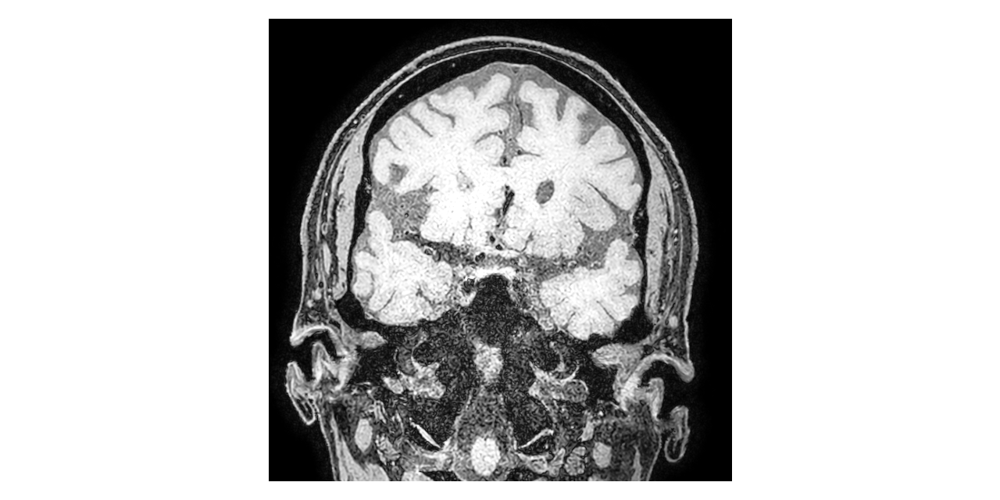

SB-10222-1_20181114102050_MP RAGE.nii
SB-10222-1 20181114102050 T1


<IPython.core.display.Javascript object>


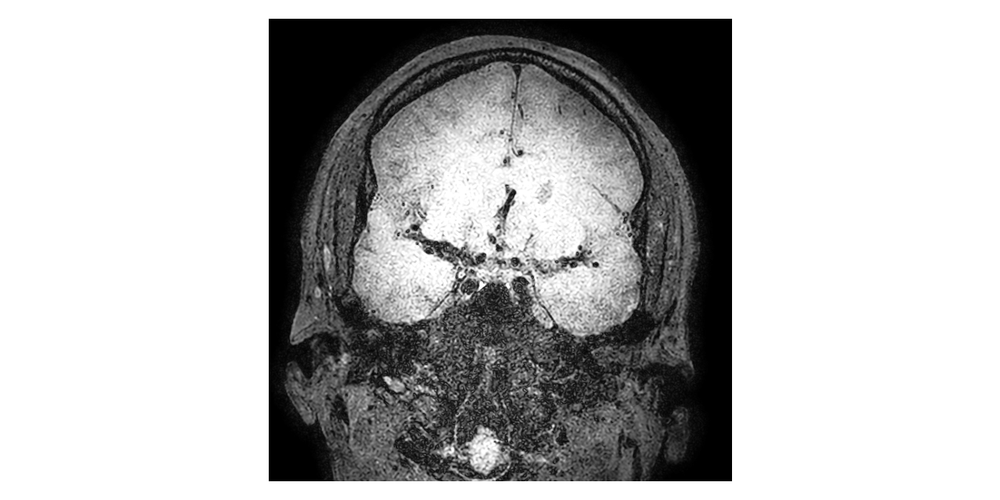

SB-10222-1_20181114102050_T1.nii
SB-10222-1 20191206170244 MP RAGE


<IPython.core.display.Javascript object>


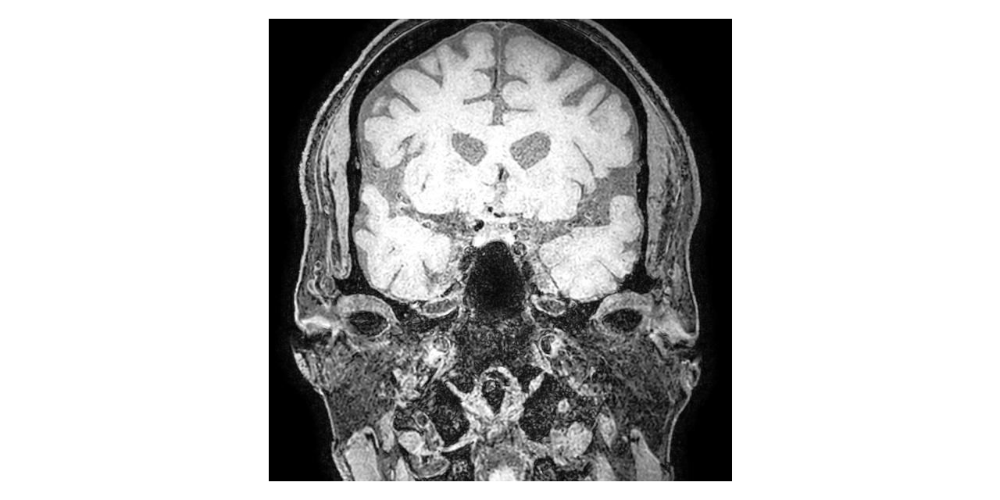

SB-10222-1_20191206170244_MP RAGE.nii
SB-10222-1 20191206170244 T1


<IPython.core.display.Javascript object>


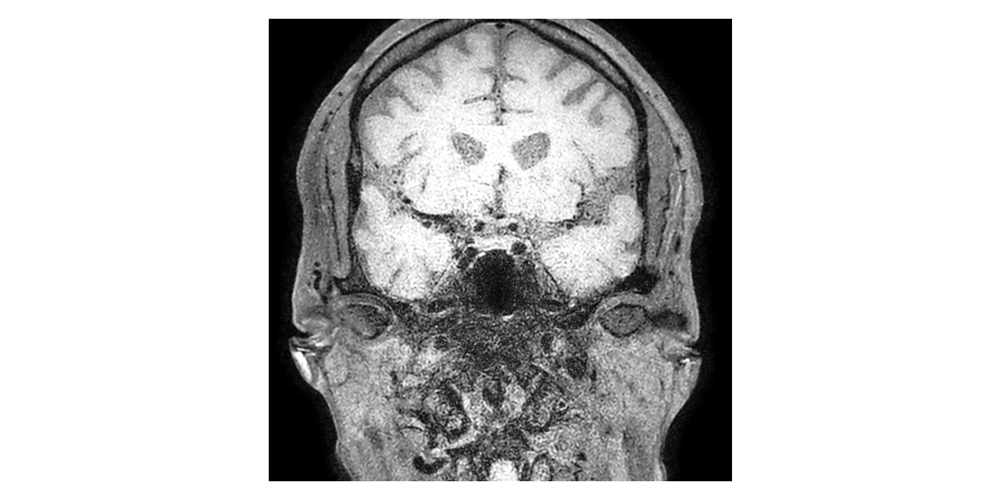

SB-10222-1_20191206170244_T1.nii
SB-10222-1 20181114102050 T1 GD


<IPython.core.display.Javascript object>


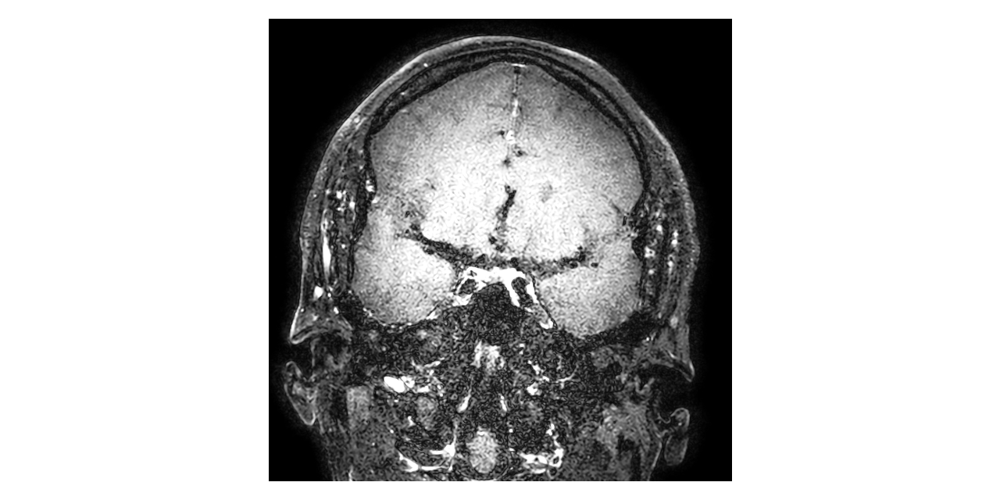

SB-10222-1_20181114102050_T1 GD.nii
SB-10222-1 20181114102050 TOF


<IPython.core.display.Javascript object>


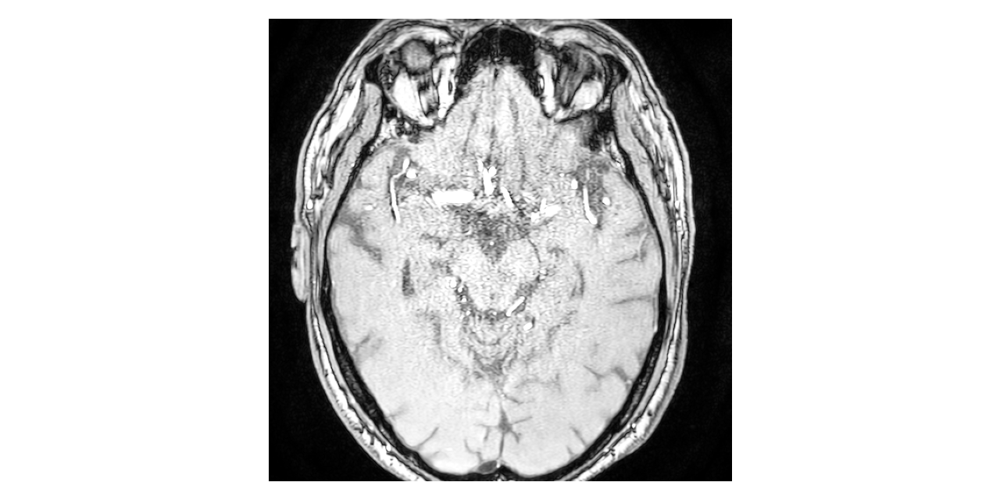

SB-10222-1_20181114102050_TOF.nii
SB-10222-1 20191206170244 roll


<IPython.core.display.Javascript object>


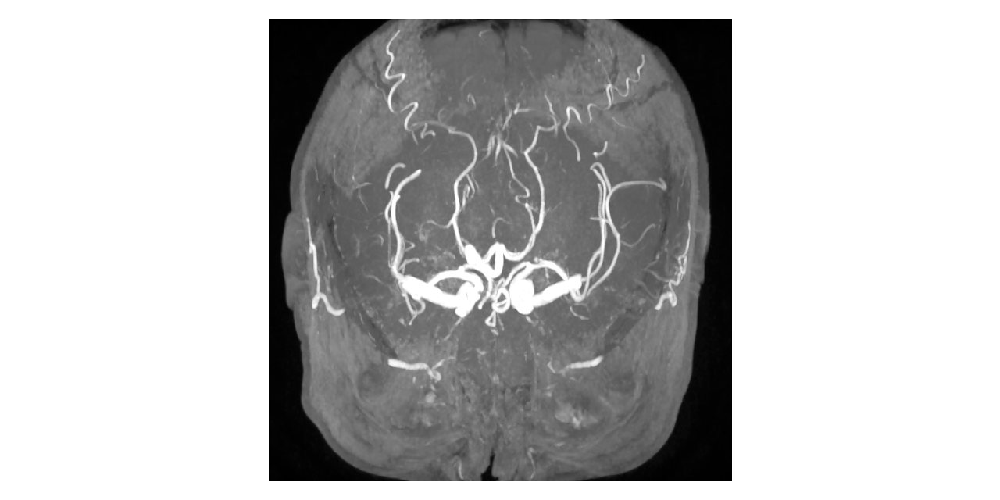

SB-10222-1_20191206170244_roll.nii
SB-10222-1 20191206170244 spin


<IPython.core.display.Javascript object>


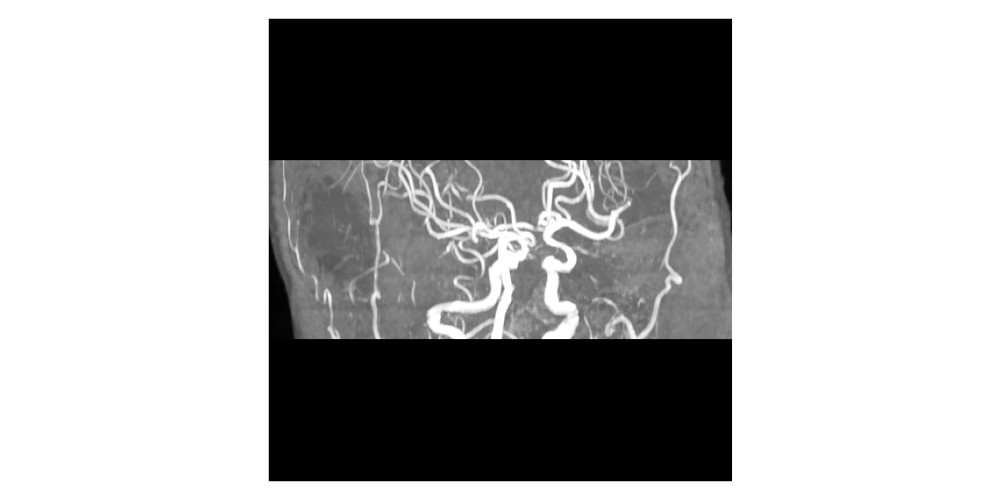

SB-10222-1_20191206170244_spin.nii
SB-10222-1 20181114102050 spin


<IPython.core.display.Javascript object>


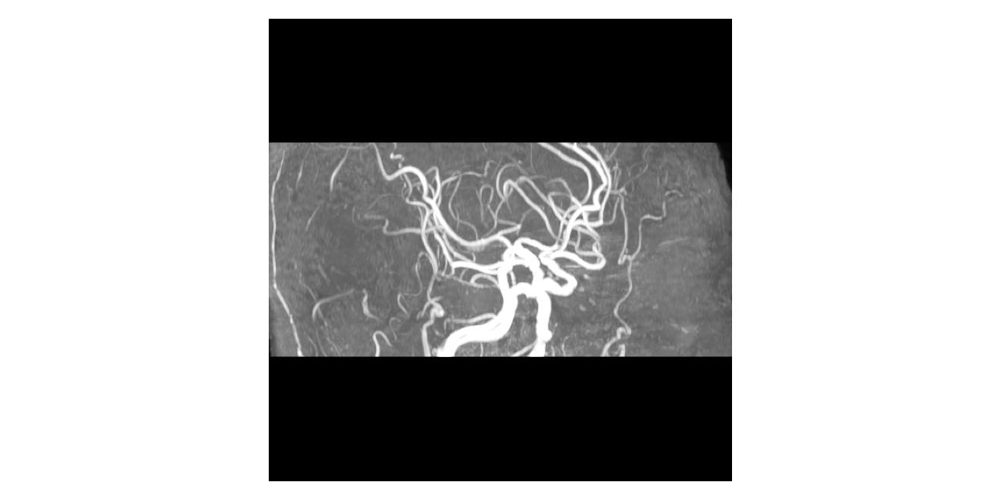

SB-10222-1_20181114102050_spin.nii
SB-10222-1 20181114102050 roll


<IPython.core.display.Javascript object>


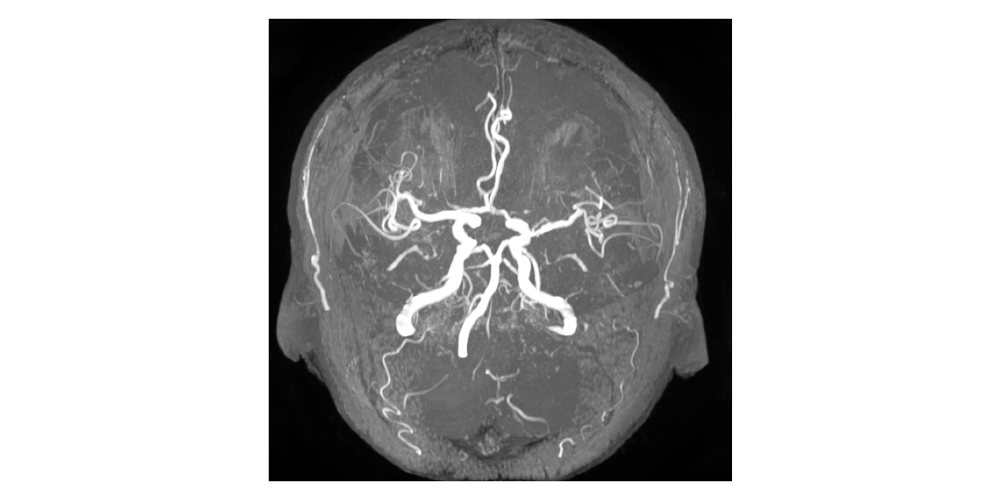

SB-10222-1_20181114102050_roll.nii
SB-10222-1 20181114102050 PD


<IPython.core.display.Javascript object>


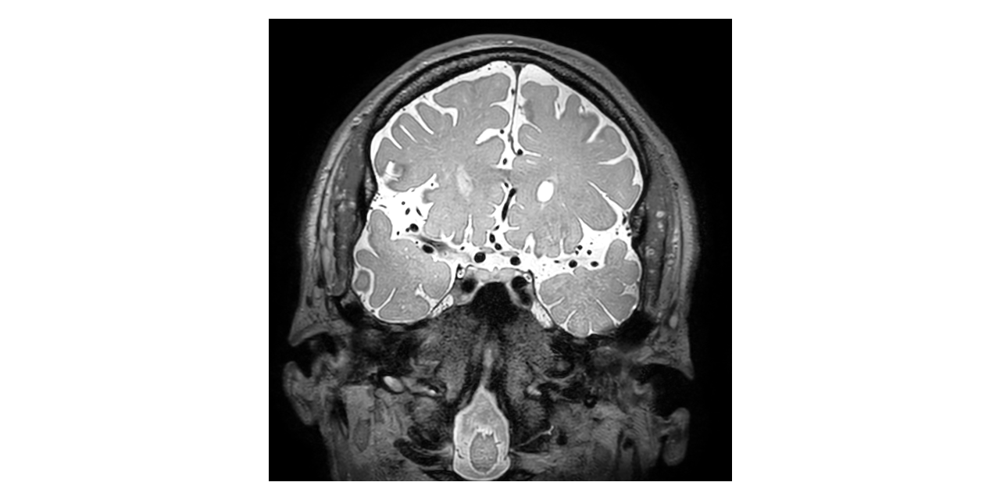

SB-10222-1_20181114102050_PD.nii
SB-10222-1 20191206170244 PD


<IPython.core.display.Javascript object>


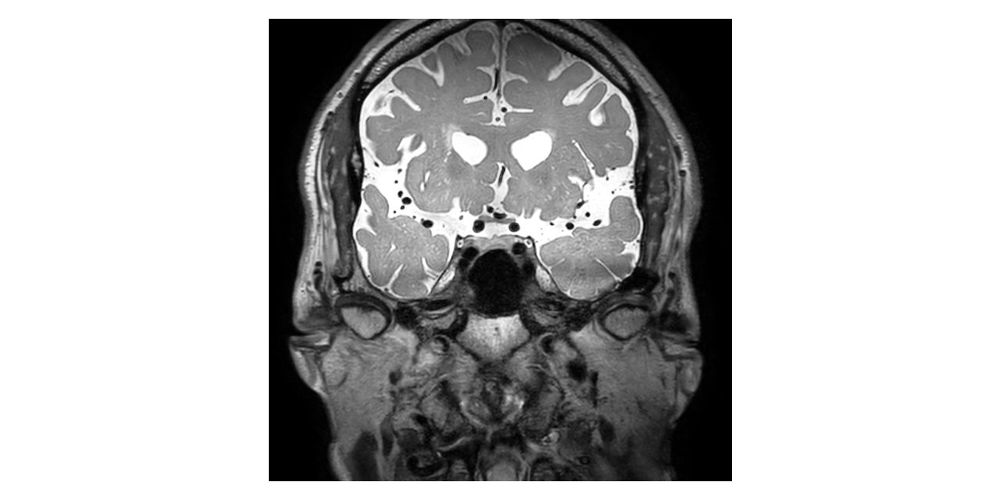

SB-10222-1_20191206170244_PD.nii
SB-10222-1 20191206170244 T1 GD


<IPython.core.display.Javascript object>


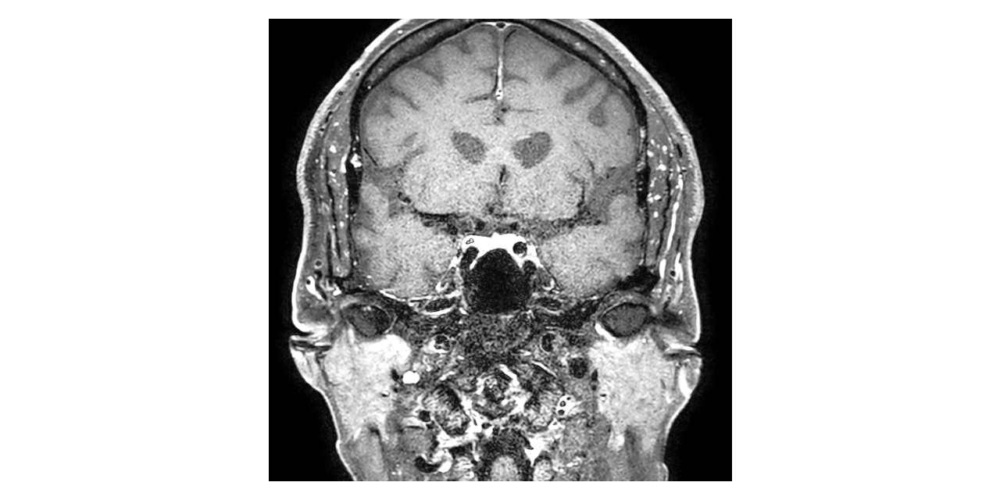

SB-10222-1_20191206170244_T1 GD.nii
SB-10222-1 20191206170244 TOF


<IPython.core.display.Javascript object>


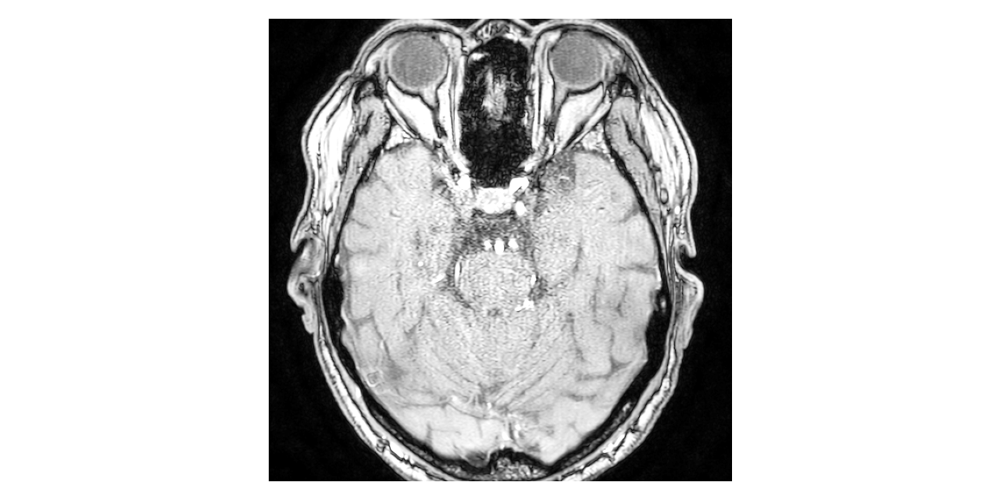

SB-10222-1_20191206170244_TOF.nii


In [5]:
input_files = os.listdir(INPUT_DIR)

for filename in input_files:
    exp = filename.strip().split('.')[-1]
    if exp not in 'nii':
        continue
    
    pt_id = filename.strip().split('_')[0]
    ymdhm = filename.strip().split('_')[1]
    img_mode = filename.strip().replace('.','_').split('_')[2]
    print(pt_id, ymdhm, img_mode)
    image = sitk.ReadImage(INPUT_DIR+ '/' + filename)
    
    gui.MultiImageDisplay([image], figure_size=(8,4))
    print(filename)

In [6]:
i_mprage = sitk.ReadImage('./SB-10222-1/SB-10222-1_20181114102050_MP RAGE.nii')
i_pret1 = sitk.ReadImage('./SB-10222-1/SB-10222-1_20181114102050_T1.nii')
i_pd = sitk.ReadImage('./SB-10222-1/SB-10222-1_20181114102050_PD.nii')
i_postt1 = sitk.ReadImage('./SB-10222-1/SB-10222-1_20181114102050_T1 GD.nii')
i_tof = sitk.ReadImage('./SB-10222-1/SB-10222-1_20181114102050_TOF.nii')
i_roll = sitk.ReadImage('./SB-10222-1/SB-10222-1_20181114102050_roll.nii')
i_spin = sitk.ReadImage('./SB-10222-1/SB-10222-1_20181114102050_spin.nii')

a_mprage = sitk.ReadImage('./SB-10222-1/SB-10222-1_20191206170244_MP RAGE.nii')
a_pret1 = sitk.ReadImage('./SB-10222-1/SB-10222-1_20191206170244_T1.nii')
a_pd = sitk.ReadImage('./SB-10222-1/SB-10222-1_20191206170244_PD.nii')
a_postt1 = sitk.ReadImage('./SB-10222-1/SB-10222-1_20191206170244_T1 GD.nii')
a_tof = sitk.ReadImage('./SB-10222-1/SB-10222-1_20191206170244_TOF.nii')
a_roll = sitk.ReadImage('./SB-10222-1/SB-10222-1_20191206170244_roll.nii')
a_spin = sitk.ReadImage('./SB-10222-1/SB-10222-1_20191206170244_spin.nii')

## 이미지 확인

<IPython.core.display.Javascript object>


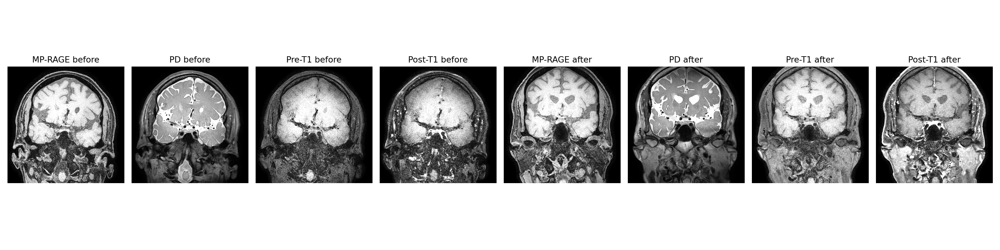

In [92]:
gui.MultiImageDisplay(image_list =[i_mprage, i_pd, i_pret1, i_postt1,
                                   a_mprage, a_pd, a_pret1, a_postt1],
                     title_list=['MP-RAGE before', 'PD before', 'Pre-T1 before', 'Post-T1 before',
                                 'MP-RAGE after', 'PD after', 'Pre-T1 after', 'Post-T1 after'],
                     figure_size=(20,5))

<IPython.core.display.Javascript object>


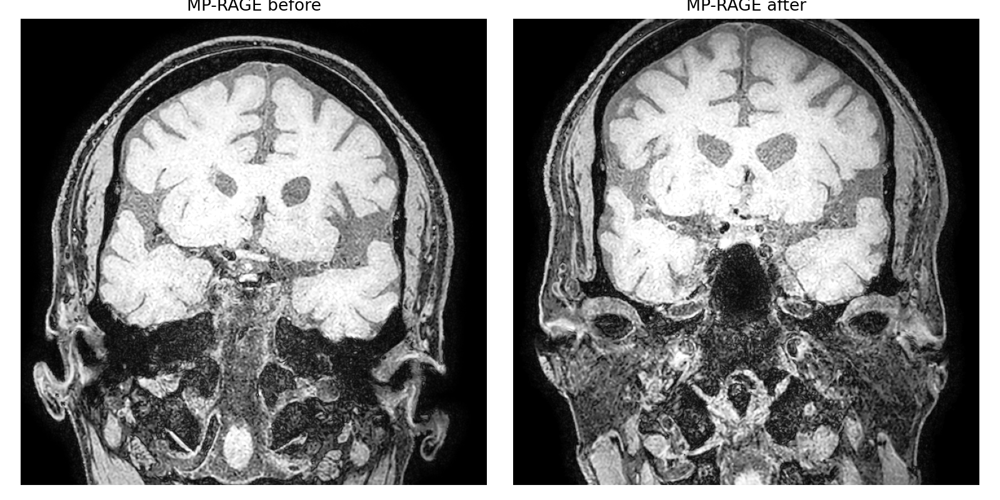

In [49]:
gui.MultiImageDisplay(image_list =[i_mprage, a_mprage],
                     title_list=['MP-RAGE before','MP-RAGE after'],
                     figure_size=(10,5))

## Registration

### serial MP-RAGE비교

<IPython.core.display.Javascript object>


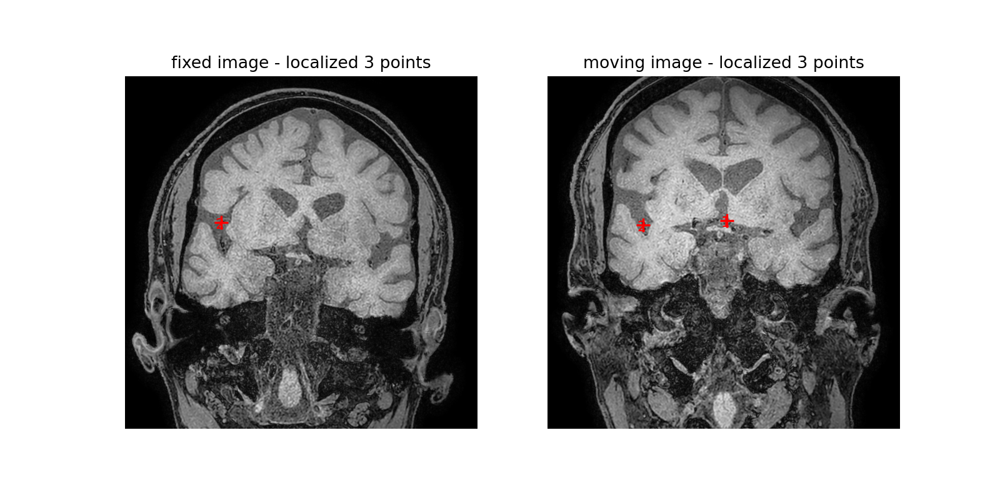

In [95]:
initial_transform = sitk.CenteredTransformInitializer(i_mprage, 
                                                      a_mprage, 
                                                      sitk.Euler3DTransform(), 
                                                      sitk.CenteredTransformInitializerFilter.GEOMETRY)

gui.RegistrationPointDataAquisition(i_mprage, a_mprage, figure_size=(10,5), known_transformation=initial_transform)

<IPython.core.display.Javascript object>


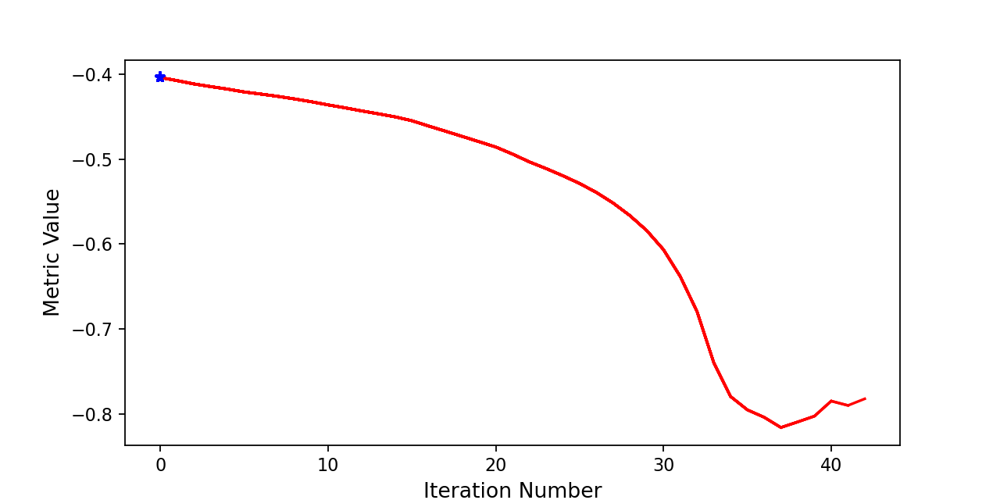

Final metric value: -0.784066976505466
Optimizer's stopping condition, GradientDescentOptimizerv4Template: Convergence checker passed at iteration 43.


In [99]:
registration_method = sitk.ImageRegistrationMethod()

# Similarity metric settings.
registration_method.SetMetricAsMattesMutualInformation(numberOfHistogramBins=50)
registration_method.SetMetricSamplingStrategy(registration_method.RANDOM)
registration_method.SetMetricSamplingPercentage(0.01)

registration_method.SetInterpolator(sitk.sitkLinear)

# Optimizer settings.
registration_method.SetOptimizerAsGradientDescent(learningRate=1.0, numberOfIterations=1000, convergenceMinimumValue=1e-6, convergenceWindowSize=10)
registration_method.SetOptimizerScalesFromPhysicalShift()

# Setup for the multi-resolution framework.            
# registration_method.SetShrinkFactorsPerLevel(shrinkFactors = [4,2,1])
# registration_method.SetSmoothingSigmasPerLevel(smoothingSigmas=[2,1,0])
# registration_method.SmoothingSigmasAreSpecifiedInPhysicalUnitsOn()

# Don't optimize in-place, we would possibly like to run this cell multiple times.
registration_method.SetInitialTransform(initial_transform, inPlace=False)

# Connect all of the observers so that we can perform plotting during registration.
registration_method.AddCommand(sitk.sitkStartEvent, rgui.start_plot)
registration_method.AddCommand(sitk.sitkEndEvent, rgui.end_plot)
registration_method.AddCommand(sitk.sitkMultiResolutionIterationEvent, rgui.update_multires_iterations) 
registration_method.AddCommand(sitk.sitkIterationEvent, lambda: rgui.plot_values(registration_method))

final_transform = registration_method.Execute(i_mprage, a_mprage)

# Always check the reason optimization terminated.
print('Final metric value: {0}'.format(registration_method.GetMetricValue()))
print('Optimizer\'s stopping condition, {0}'.format(registration_method.GetOptimizerStopConditionDescription()))

<IPython.core.display.Javascript object>


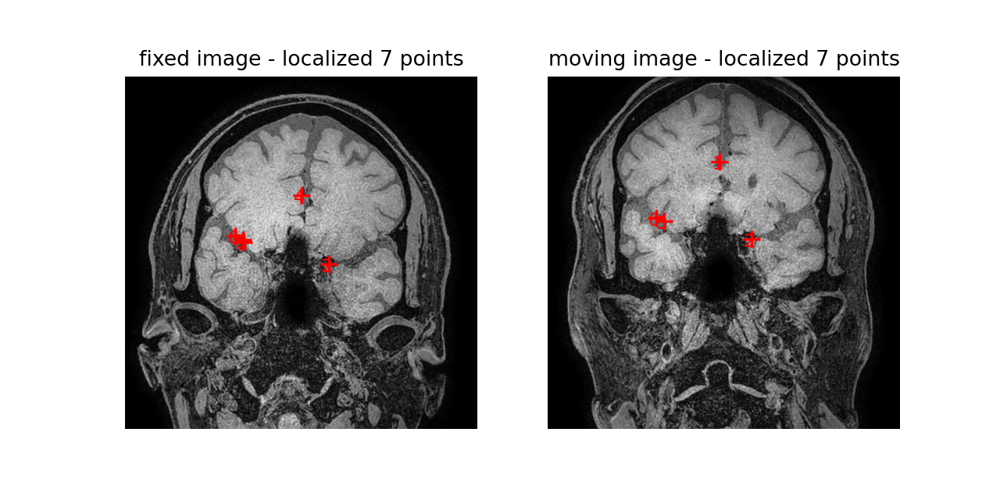

In [100]:
gui.RegistrationPointDataAquisition(i_mprage, a_mprage, 
                                    figure_size=(8,4), known_transformation=final_transform)

#### 다른 방법

<IPython.core.display.Javascript object>


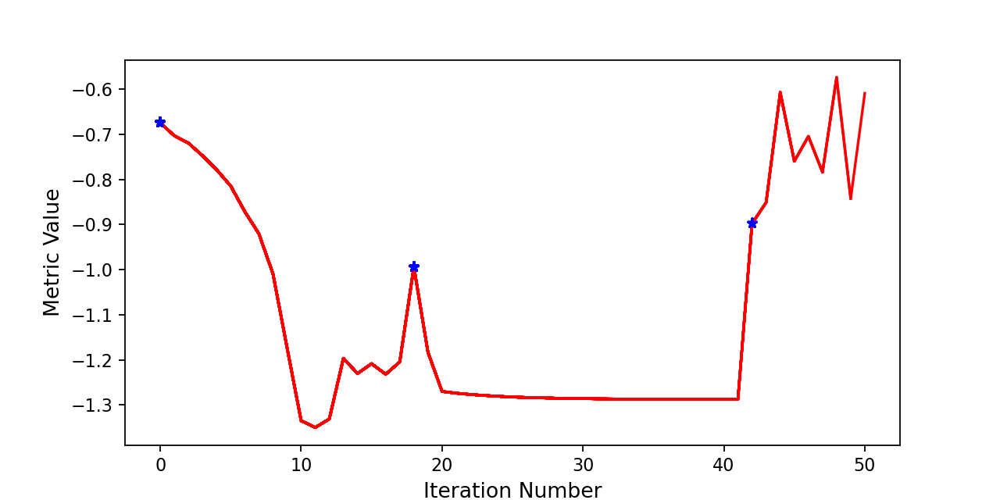

Final metric value: -0.7748409870533175
Optimizer's stopping condition, GradientDescentOptimizerv4Template: Convergence checker passed at iteration 9.


In [101]:
registration_method = sitk.ImageRegistrationMethod()

# Similarity metric settings.
registration_method.SetMetricAsMattesMutualInformation(numberOfHistogramBins=50)
registration_method.SetMetricSamplingStrategy(registration_method.RANDOM)
registration_method.SetMetricSamplingPercentage(0.01)

registration_method.SetInterpolator(sitk.sitkLinear)

# Optimizer settings.
registration_method.SetOptimizerAsGradientDescent(learningRate=1.0, numberOfIterations=1000, convergenceMinimumValue=1e-6, convergenceWindowSize=10)
registration_method.SetOptimizerScalesFromPhysicalShift()

# Setup for the multi-resolution framework.            
registration_method.SetShrinkFactorsPerLevel(shrinkFactors = [4,2,1])
registration_method.SetSmoothingSigmasPerLevel(smoothingSigmas=[2,1,0])
registration_method.SmoothingSigmasAreSpecifiedInPhysicalUnitsOn()

# Set the initial moving and optimized transforms.
optimized_transform = sitk.Euler3DTransform()    
registration_method.SetMovingInitialTransform(initial_transform)
registration_method.SetInitialTransform(optimized_transform, inPlace=False)

# Connect all of the observers so that we can perform plotting during registration.
registration_method.AddCommand(sitk.sitkStartEvent, rgui.start_plot)
registration_method.AddCommand(sitk.sitkEndEvent, rgui.end_plot)
registration_method.AddCommand(sitk.sitkMultiResolutionIterationEvent, rgui.update_multires_iterations) 
registration_method.AddCommand(sitk.sitkIterationEvent, lambda: rgui.plot_values(registration_method))

# Need to compose the transformations after registration.
final_transform_v4 = sitk.CompositeTransform([registration_method.Execute(i_mprage, a_mprage), initial_transform])

# Always check the reason optimization terminated.
print('Final metric value: {0}'.format(registration_method.GetMetricValue()))
print('Optimizer\'s stopping condition, {0}'.format(registration_method.GetOptimizerStopConditionDescription()))

<IPython.core.display.Javascript object>


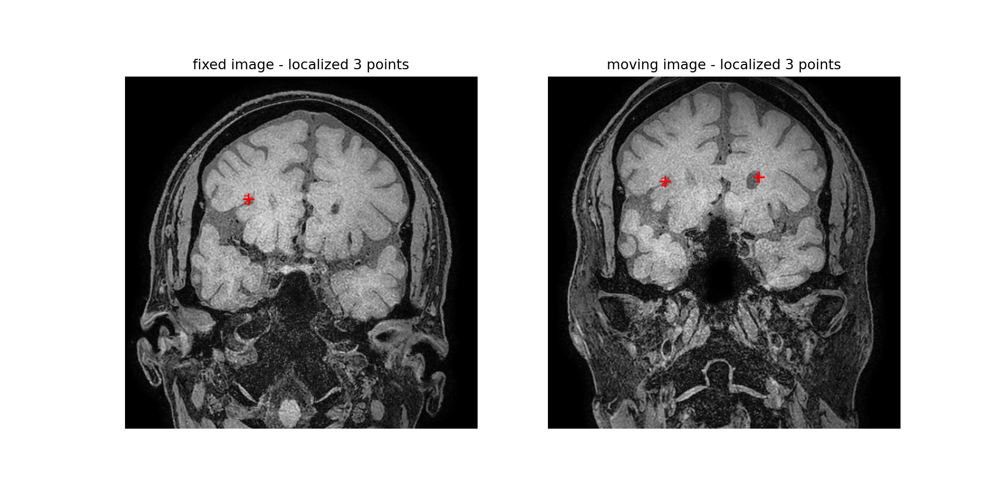

In [102]:
gui.RegistrationPointDataAquisition(i_mprage, a_mprage, 
                                    figure_size=(12,6), known_transformation=final_transform_v4)

#### exhaustive initialization

<IPython.core.display.Javascript object>


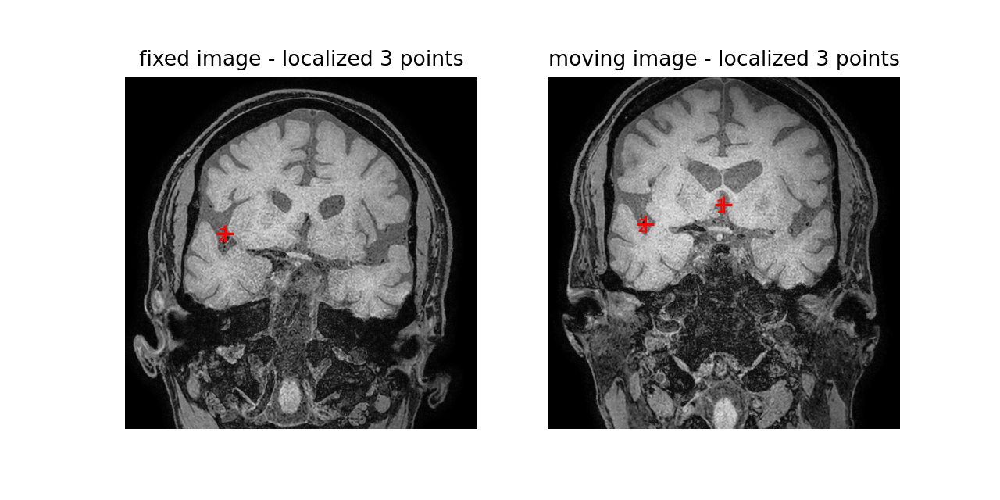

In [94]:
initial_transform2 = sitk.CenteredTransformInitializer(i_mprage, 
                                                      a_mprage, 
                                                      sitk.Euler3DTransform(), 
                                                      sitk.CenteredTransformInitializerFilter.MOMENTS)
registration_method = sitk.ImageRegistrationMethod()
registration_method.SetMetricAsMattesMutualInformation(numberOfHistogramBins=50)
registration_method.SetMetricSamplingStrategy(registration_method.RANDOM)
registration_method.SetMetricSamplingPercentage(0.01)
registration_method.SetInterpolator(sitk.sitkLinear)
# The order of parameters for the Euler3DTransform is [angle_x, angle_y, angle_z, t_x, t_y, t_z]. The parameter 
# sampling grid is centered on the initial_transform parameter values, that are all zero for the rotations. Given
# the number of steps, their length and optimizer scales we have:
# angle_x = 0
# angle_y = -pi, 0, pi
# angle_z = -pi, 0, pi
registration_method.SetOptimizerAsExhaustive(numberOfSteps=[0,1,1,0,0,0], stepLength = np.pi)
registration_method.SetOptimizerScales([1,1,1,1,1,1])

#Perform the registration in-place so that the initial_transform is modified.
registration_method.SetInitialTransform(initial_transform2, inPlace=True)
registration_method.Execute(i_mprage, a_mprage)

gui.RegistrationPointDataAquisition(i_mprage, a_mprage, figure_size=(8,4), known_transformation=initial_transform2)

<IPython.core.display.Javascript object>


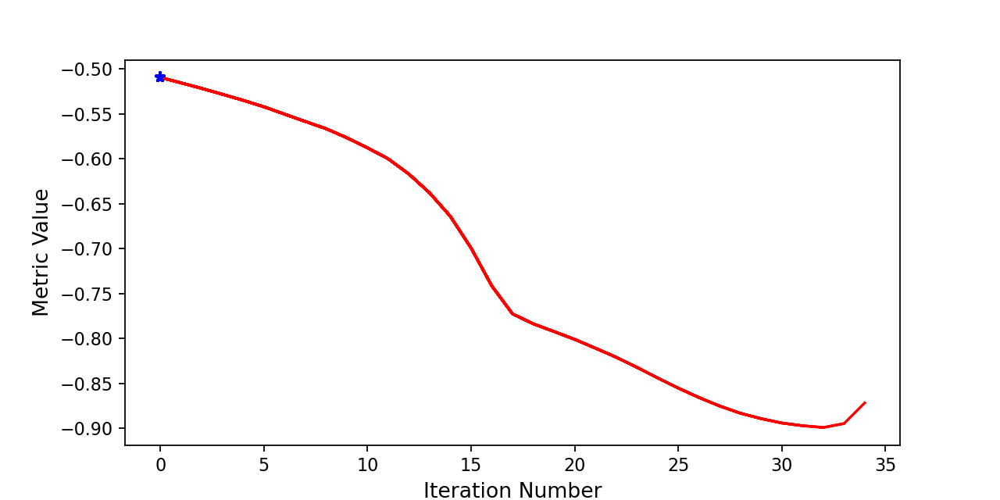

Final metric value: -0.820082019477716
Optimizer's stopping condition, GradientDescentOptimizerv4Template: Convergence checker passed at iteration 35.


In [104]:
registration_method = sitk.ImageRegistrationMethod()

# Similarity metric settings.
registration_method.SetMetricAsMattesMutualInformation(numberOfHistogramBins=50)
registration_method.SetMetricSamplingStrategy(registration_method.RANDOM)
registration_method.SetMetricSamplingPercentage(0.01)

registration_method.SetInterpolator(sitk.sitkLinear)

# Optimizer settings.
registration_method.SetOptimizerAsGradientDescent(learningRate=1.0, numberOfIterations=1000, convergenceMinimumValue=1e-6, convergenceWindowSize=10)
registration_method.SetOptimizerScalesFromPhysicalShift()

# Setup for the multi-resolution framework.            
# registration_method.SetShrinkFactorsPerLevel(shrinkFactors = [4,2,1])
# registration_method.SetSmoothingSigmasPerLevel(smoothingSigmas=[2,1,0])
# registration_method.SmoothingSigmasAreSpecifiedInPhysicalUnitsOn()

# Don't optimize in-place, we would possibly like to run this cell multiple times.
registration_method.SetInitialTransform(initial_transform2, inPlace=True)

# Connect all of the observers so that we can perform plotting during registration.
registration_method.AddCommand(sitk.sitkStartEvent, rgui.start_plot)
registration_method.AddCommand(sitk.sitkEndEvent, rgui.end_plot)
registration_method.AddCommand(sitk.sitkMultiResolutionIterationEvent, rgui.update_multires_iterations) 
registration_method.AddCommand(sitk.sitkIterationEvent, lambda: rgui.plot_values(registration_method))

final_transform = registration_method.Execute(i_mprage, a_mprage)

# Always check the reason optimization terminated.
print('Final metric value: {0}'.format(registration_method.GetMetricValue()))
print('Optimizer\'s stopping condition, {0}'.format(registration_method.GetOptimizerStopConditionDescription()))

<IPython.core.display.Javascript object>


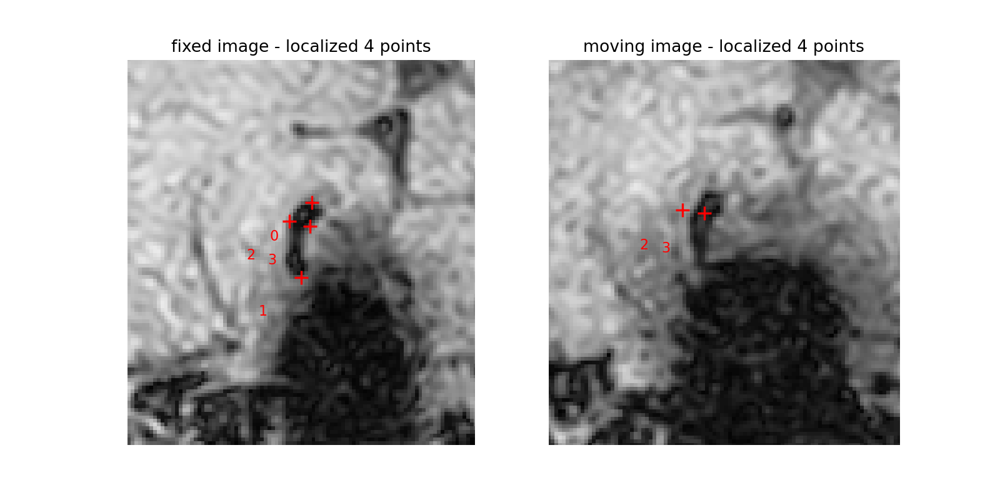

In [105]:
gui.RegistrationPointDataAquisition(i_mprage, a_mprage, 
                                    figure_size=(10,5), known_transformation=final_transform)

#### 다른 방법

<IPython.core.display.Javascript object>


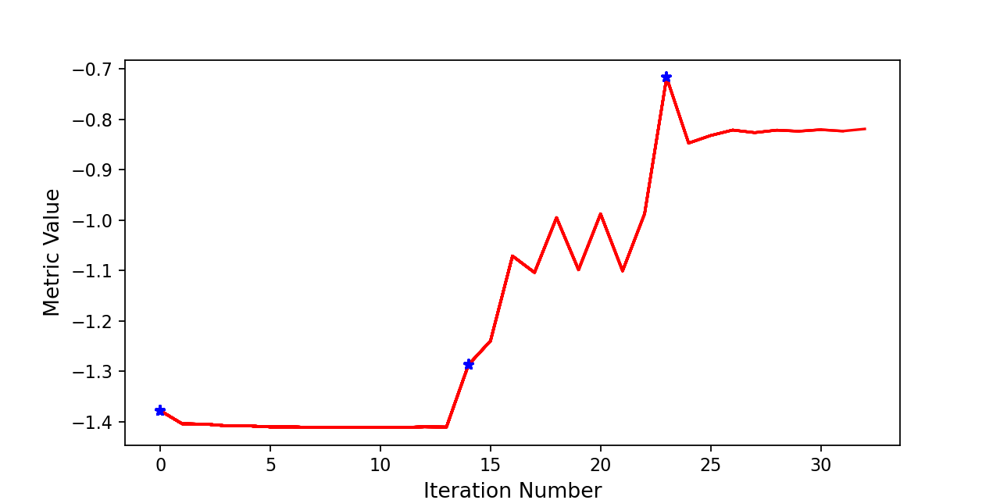

Final metric value: -0.8238332900321107
Optimizer's stopping condition, GradientDescentOptimizerv4Template: Convergence checker passed at iteration 10.


In [111]:
registration_method = sitk.ImageRegistrationMethod()

# Similarity metric settings.
registration_method.SetMetricAsMattesMutualInformation(numberOfHistogramBins=50)
registration_method.SetMetricSamplingStrategy(registration_method.RANDOM)
registration_method.SetMetricSamplingPercentage(0.01)

registration_method.SetInterpolator(sitk.sitkLinear)

# Optimizer settings.
registration_method.SetOptimizerAsGradientDescent(learningRate=1.0, numberOfIterations=1000, convergenceMinimumValue=1e-6, convergenceWindowSize=10)
registration_method.SetOptimizerScalesFromPhysicalShift()

# Setup for the multi-resolution framework.            
registration_method.SetShrinkFactorsPerLevel(shrinkFactors = [4,2,1])
registration_method.SetSmoothingSigmasPerLevel(smoothingSigmas=[2,1,0])
registration_method.SmoothingSigmasAreSpecifiedInPhysicalUnitsOn()

# Set the initial moving and optimized transforms.
optimized_transform = sitk.Euler3DTransform()    
registration_method.SetMovingInitialTransform(initial_transform2)
registration_method.SetInitialTransform(optimized_transform, inPlace=True)

# Connect all of the observers so that we can perform plotting during registration.
registration_method.AddCommand(sitk.sitkStartEvent, rgui.start_plot)
registration_method.AddCommand(sitk.sitkEndEvent, rgui.end_plot)
registration_method.AddCommand(sitk.sitkMultiResolutionIterationEvent, rgui.update_multires_iterations) 
registration_method.AddCommand(sitk.sitkIterationEvent, lambda: rgui.plot_values(registration_method))

# Need to compose the transformations after registration.
final_transform_v4 = sitk.CompositeTransform([registration_method.Execute(i_mprage, a_mprage), initial_transform2])

# Always check the reason optimization terminated.
print('Final metric value: {0}'.format(registration_method.GetMetricValue()))
print('Optimizer\'s stopping condition, {0}'.format(registration_method.GetOptimizerStopConditionDescription()))

<IPython.core.display.Javascript object>


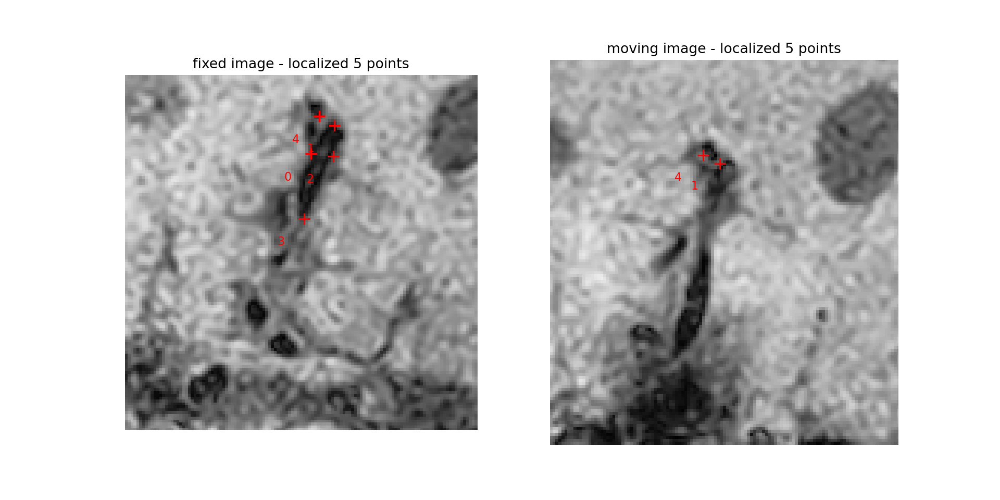

In [112]:
gui.RegistrationPointDataAquisition(i_mprage, a_mprage, 
                                    figure_size=(12,6), known_transformation=final_transform_v4)

## Demon based registration -> 이거 쓰게 되면 따로 module 빼기로

In [128]:
def smooth_and_resample(image, shrink_factor, smoothing_sigma):
    """
    Args:
        image: The image we want to resample.
        shrink_factor: A number greater than one, such that the new image's size is original_size/shrink_factor.
        smoothing_sigma: Sigma for Gaussian smoothing, this is in physical (image spacing) units, not pixels.
    Return:
        Image which is a result of smoothing the input and then resampling it using the given sigma and shrink factor.
    """
    smoothed_image = sitk.SmoothingRecursiveGaussian(image, smoothing_sigma)
    
    original_spacing = image.GetSpacing()
    original_size = image.GetSize()
    new_size = [int(sz/float(shrink_factor) + 0.5) for sz in original_size]
    new_spacing = [((original_sz-1)*original_spc)/(new_sz-1) 
                   for original_sz, original_spc, new_sz in zip(original_size, original_spacing, new_size)]
    return sitk.Resample(smoothed_image, new_size, sitk.Transform(), 
                         sitk.sitkLinear, image.GetOrigin(),
                         new_spacing, image.GetDirection(), 0.0, 
                         image.GetPixelID())


    
def multiscale_demons(registration_algorithm,
                      fixed_image, moving_image, initial_transform = None, 
                      shrink_factors=None, smoothing_sigmas=None):
    """
    Run the given registration algorithm in a multiscale fashion. The original scale should not be given as input as the
    original images are implicitly incorporated as the base of the pyramid.
    Args:
        registration_algorithm: Any registration algorithm that has an Execute(fixed_image, moving_image, displacement_field_image)
                                method.
        fixed_image: Resulting transformation maps points from this image's spatial domain to the moving image spatial domain.
        moving_image: Resulting transformation maps points from the fixed_image's spatial domain to this image's spatial domain.
        initial_transform: Any SimpleITK transform, used to initialize the displacement field.
        shrink_factors: Shrink factors relative to the original image's size.
        smoothing_sigmas: Amount of smoothing which is done prior to resmapling the image using the given shrink factor. These
                          are in physical (image spacing) units.
    Returns: 
        SimpleITK.DisplacementFieldTransform
    """
    # Create image pyramid.
    fixed_images = [fixed_image]
    moving_images = [moving_image]
    if shrink_factors:
        for shrink_factor, smoothing_sigma in reversed(list(zip(shrink_factors, smoothing_sigmas))):
            fixed_images.append(smooth_and_resample(fixed_images[0], shrink_factor, smoothing_sigma))
            moving_images.append(smooth_and_resample(moving_images[0], shrink_factor, smoothing_sigma))
    
    # Create initial displacement field at lowest resolution. 
    # Currently, the pixel type is required to be sitkVectorFloat64 because of a constraint imposed by the Demons filters.
    if initial_transform:
        initial_displacement_field = sitk.TransformToDisplacementField(initial_transform, 
                                                                       sitk.sitkVectorFloat64,
                                                                       fixed_images[-1].GetSize(),
                                                                       fixed_images[-1].GetOrigin(),
                                                                       fixed_images[-1].GetSpacing(),
                                                                       fixed_images[-1].GetDirection())
    else:
        initial_displacement_field = sitk.Image(fixed_images[-1].GetWidth(), 
                                                fixed_images[-1].GetHeight(),
                                                fixed_images[-1].GetDepth(),
                                                sitk.sitkVectorFloat64)
        initial_displacement_field.CopyInformation(fixed_images[-1])
 
    # Run the registration.            
    initial_displacement_field = registration_algorithm.Execute(fixed_images[-1], 
                                                                moving_images[-1], 
                                                                initial_displacement_field)
    # Start at the top of the pyramid and work our way down.    
    for f_image, m_image in reversed(list(zip(fixed_images[0:-1], moving_images[0:-1]))):
            initial_displacement_field = sitk.Resample (initial_displacement_field, f_image)
            initial_displacement_field = registration_algorithm.Execute(f_image, m_image, initial_displacement_field)
    return sitk.DisplacementFieldTransform(initial_displacement_field)

In [18]:
viewer.Execute(fixed_image)

MetaImageIO (0x7fd8382a3a00): Unsupported or empty metaData item ITK_FileNotes of type NSt3__112basic_stringIcNS_11char_traitsIcEENS_9allocatorIcEEEEfound, won't be written to image file

MetaImageIO (0x7fd8382a3a00): Unsupported or empty metaData item aux_file of type NSt3__112basic_stringIcNS_11char_traitsIcEENS_9allocatorIcEEEEfound, won't be written to image file

MetaImageIO (0x7fd8382a3a00): Unsupported or empty metaData item descrip of type NSt3__112basic_stringIcNS_11char_traitsIcEENS_9allocatorIcEEEEfound, won't be written to image file

MetaImageIO (0x7fd8382a3a00): Unsupported or empty metaData item intent_name of type NSt3__112basic_stringIcNS_11char_traitsIcEENS_9allocatorIcEEEEfound, won't be written to image file

libpng warning: sCAL: invalid unit
libpng warning: sCAL: invalid unit
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: sCAL: invalid unit
lib